## YOLO v5 Implementation for PotHoles Detection

## Cloning the Yolov5 Github repository

In [1]:
!git clone "https://github.com/ultralytics/yolov5.git"

fatal: destination path 'yolov5' already exists and is not an empty directory.


## Installing the required libraries 

In [2]:
!pip install -qr yolov5/requirements.txt
print("The requirements for the yolov5 has been installed Successfully.")

%cd yolov5

# import torch
from IPython.display import Image, clear_output
!pip install utils
# from utils.downloads import gdrive_download

The requirements for the yolov5 has been installed Successfully.
/content/yolov5
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [3]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


### Download the custom Dataset that you are interested in using Roboflow api bold text

In [4]:
%cd /content 

/content


In [5]:
!curl -L "https://public.roboflow.com/ds/Ocn6NAj6Xl?key=zesoRLzE9A" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   901  100   901    0     0    491      0  0:00:01  0:00:01 --:--:--   491
100 46.0M  100 46.0M    0     0  21.1M      0  0:00:02  0:00:02 --:--:-- 21.1M
Archive:  roboflow.zip
replace README.dataset.txt? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
 extracting: README.dataset.txt      
replace README.roboflow.txt? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
 extracting: README.roboflow.txt     
replace data.yaml? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
 extracting: data.yaml               
replace test/images/img-105_jpg.rf.3fe9dff3d1631e79ecb480ff403bcb86.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
 extracting: test/images/img-105_jpg.rf.3fe9dff3d1631e79ecb480ff403bcb86.jpg  
replace test/images/img-107_jpg.rf.2e40485785f6e5e2efec404301b235c2.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
 extracting: test/images/img-107_jpg.rf.2e4048

### Create the Custom Model Configuration file 

In [6]:
%cat data.yaml

train: ../train/images
val: ../valid/images

nc: 1
names: ['pothole']

In [7]:
import yaml
with open("data.yaml","r") as stream:
  num_classes = str(yaml.safe_load(stream)["nc"])

In [8]:
%cat /content/yolov5/models/yolov5s.yaml

# YOLOv5 🚀 by Ultralytics, GPL-3.0 license

# Parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]]

In [9]:
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line,cell):
  with open(line,'w') as f:
    f.write(cell.format(**globals()))

In [10]:
%%writetemplate /content/yolov5/models/custom_yolov5s.yaml

# Parameters
nc: 1  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C3, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, C3, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, C3, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

## Training the model using the train dataset

In [24]:
%%time
%cd /content/yolov5

!python train.py --img 640 --batch 32  --epochs 280  --data '../data.yaml' --cfg ./models/custom_yolov5s.yaml --weights '' --name yolov5s_results --cache

/content/yolov5
train: weights=, cfg=./models/custom_yolov5s.yaml, data=../data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=280, batch_size=32, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=yolov5s_results, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-72-g064365d Python-3.8.16 torch-1.13.0+cu116 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_

## Plotting the result and confusion matrix of trained model

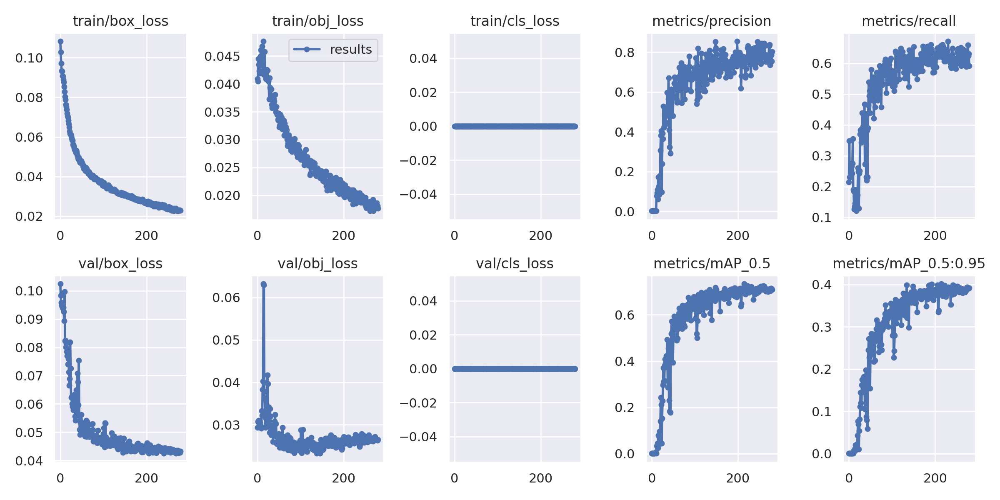

In [25]:
from IPython import display
# import matplotlib.image as mpimg
display.Image(f"runs/train/yolov5s_results5/results.png")


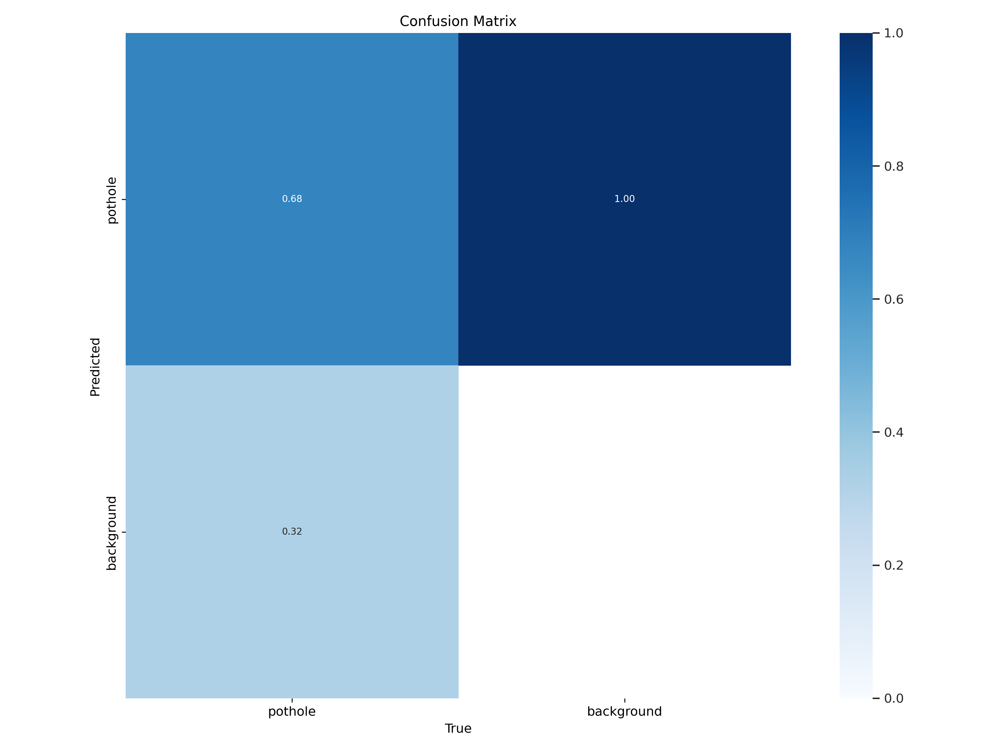

In [13]:
display.Image(f"runs/train/yolov5s_results/confusion_matrix.png",height=800)

## Validating the test data and plotting the confusion matrix of the same 

In [26]:
!python val.py --weights 'runs/train/yolov5s_results5/weights/best.pt' --batch 32 --data '../data.yaml' --name 'validation_on_test_data' --augment


val: data=../data.yaml, weights=['runs/train/yolov5s_results5/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=True, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=validation_on_test_data, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-72-g064365d Python-3.8.16 torch-1.13.0+cu116 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
custom_YOLOv5s summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
val: Scanning /content/valid/labels.cache... 133 images, 0 backgrounds, 0 corrupt: 100% 133/133 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 5/5 [00:05<00:00,  1.01s/it]
                   all        133        330      0.825      0.636      0.754       0.42
Speed: 0.3ms pre-process, 14.1ms inference, 3.7ms NMS per image at shape (32, 3, 640, 640)
Results sav

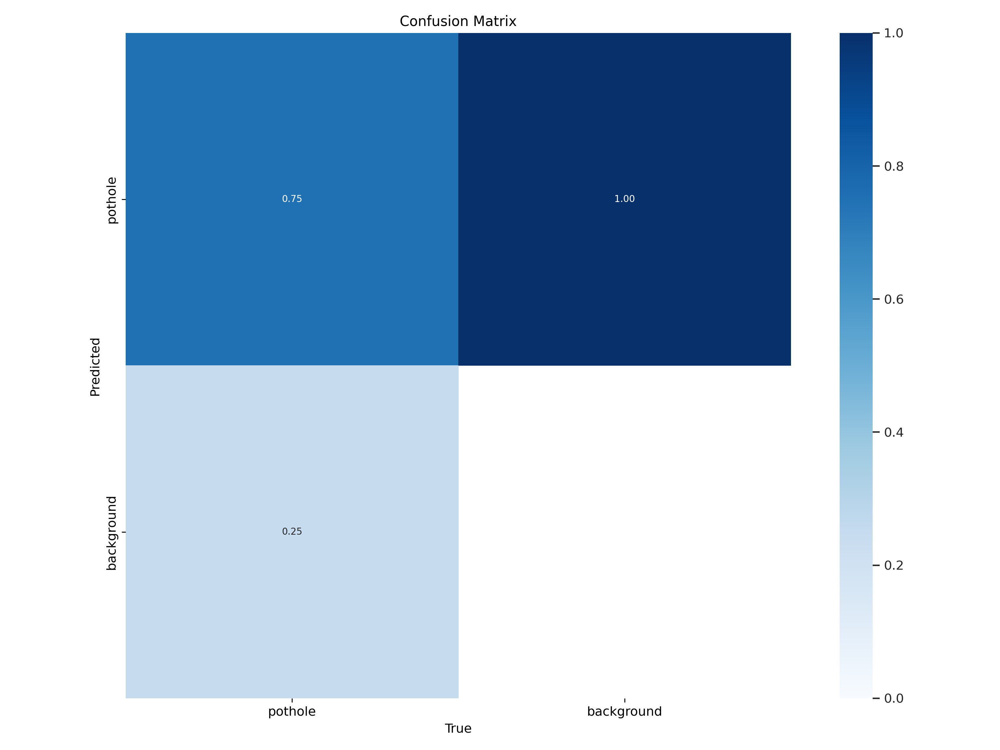

In [28]:
display.Image(f"runs/val/validation_on_test_data2/confusion_matrix.png",height=800)



## Detecting the test Images and plotting the images after it got tested 

In [29]:
!python detect.py --weights runs/train/yolov5s_results5/weights/best.pt --img 416 --conf 0.6 --source ../test/images

detect: weights=['runs/train/yolov5s_results5/weights/best.pt'], source=../test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.6, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-72-g064365d Python-3.8.16 torch-1.13.0+cu116 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
custom_YOLOv5s summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
image 1/67 /content/test/images/img-105_jpg.rf.3fe9dff3d1631e79ecb480ff403bcb86.jpg: 416x416 (no detections), 8.2ms
image 2/67 /content/test/images/img-107_jpg.rf.2e40485785f6e5e2efec404301b235c2.jpg: 416x416 1 pothole, 8.3ms
image 3/67 /content/test/images/img-146_jpg.rf.61be25b3053a51f622a244980545df2b.jpg: 416x416 1 pothole, 8

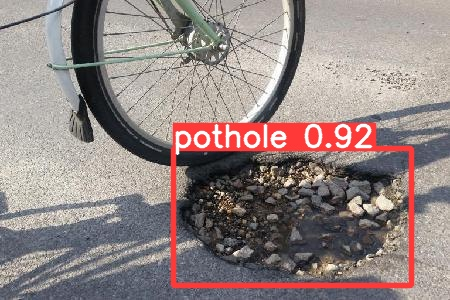

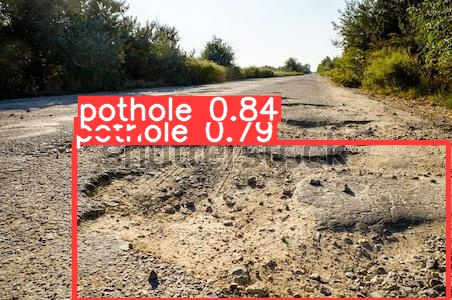

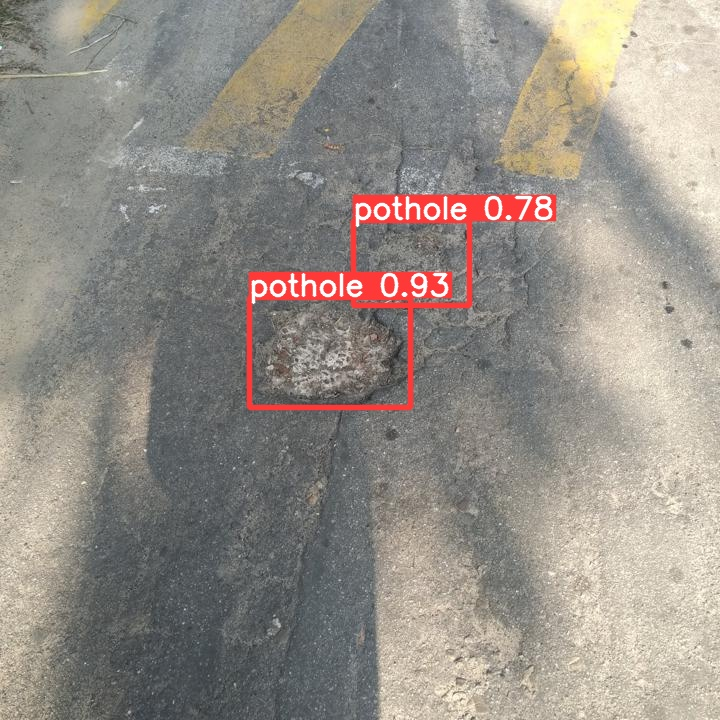

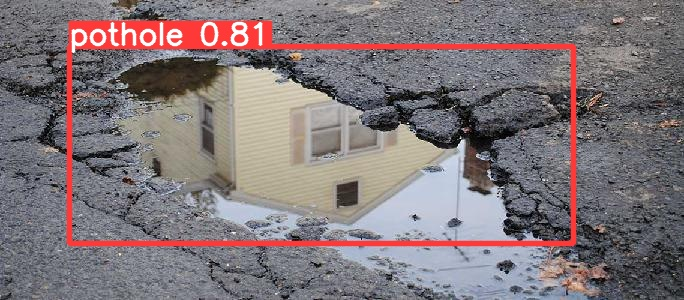

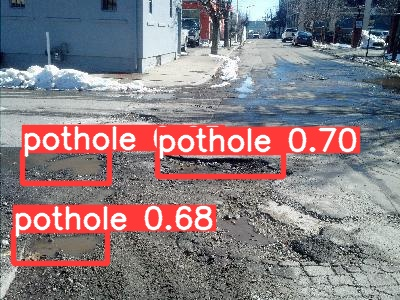

...

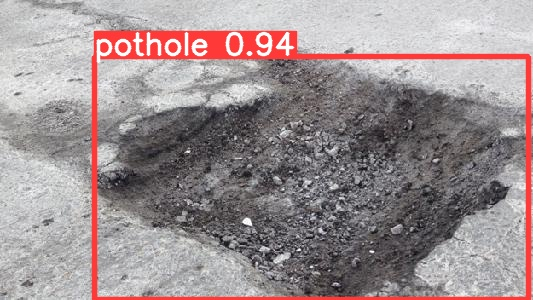

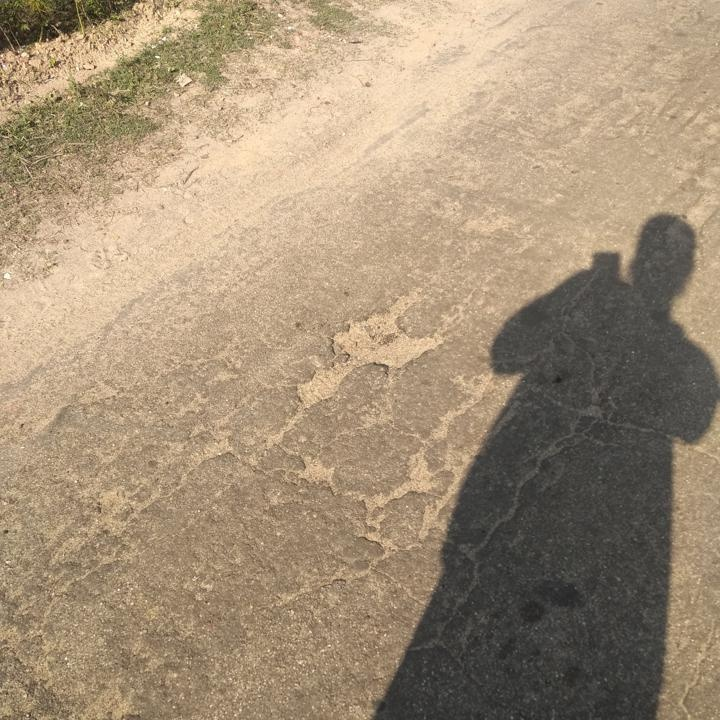

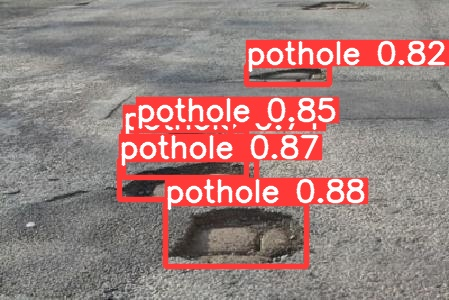

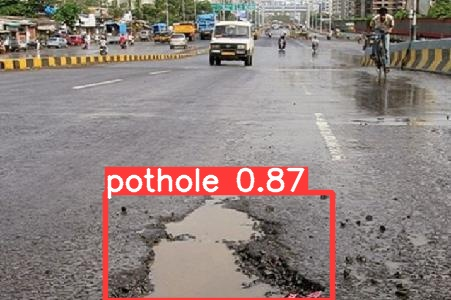

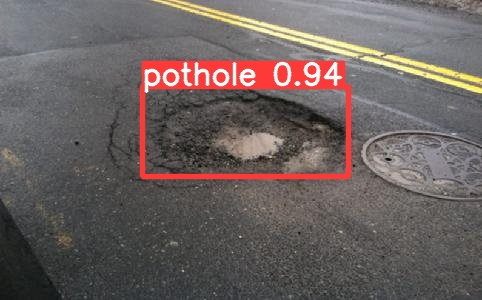

In [30]:
import glob
from IPython.display import Image,display
for imagename in glob.glob("/content/yolov5/runs/detect/exp3/*"):
  display(Image(filename=imagename))
  print("\n")

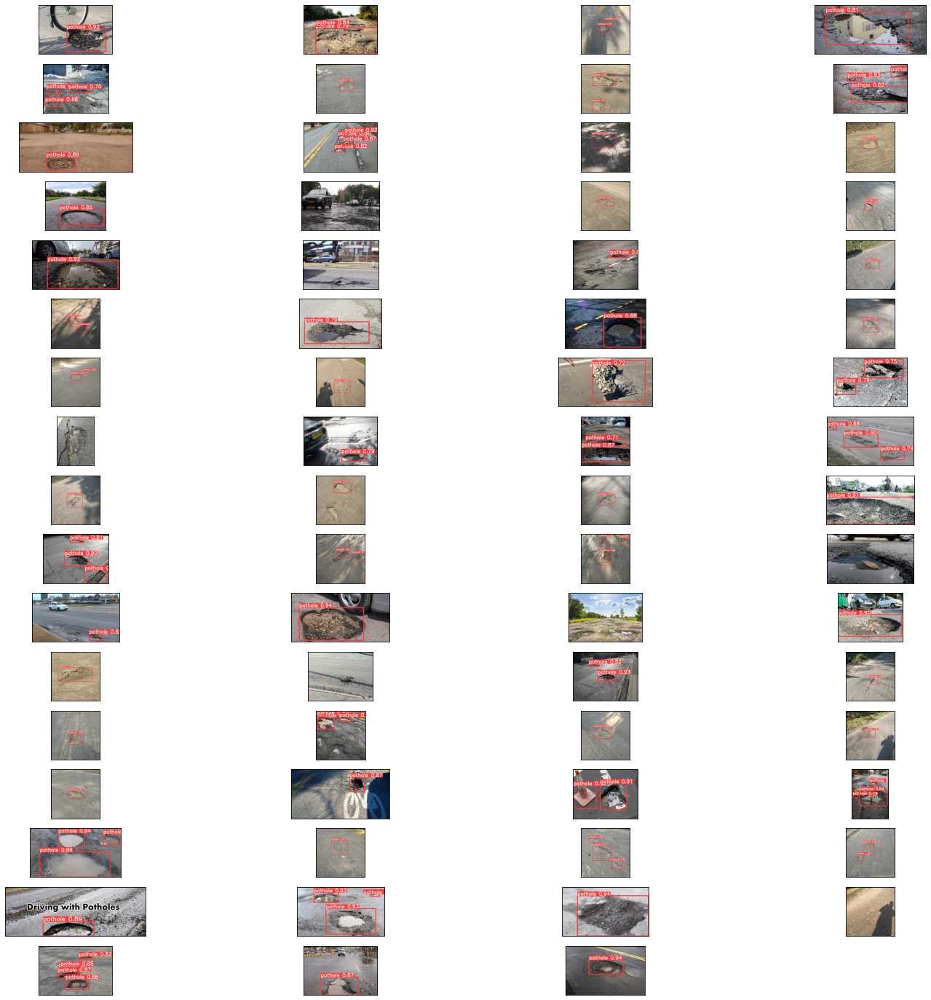

In [31]:
detect_path = r'runs/detect/exp3'

images = []
for img_path in glob.glob(detect_path + '/*.jpg'):
    images.append(mpimg.imread(img_path))

plt.figure(figsize=(25,25))
columns = 4
for i, image in enumerate(images):
    plt.subplot((int(len(images) / columns + 1)), columns, i + 1 )
    plt.tick_params(left = False, right = False , labelleft = False, labelbottom = False, bottom = False)
    plt.imshow(image)

# Testing with Foreign Images

In [32]:
!python detect.py --weights runs/train/yolov5s_results5/weights/best.pt --img 416 --conf 0.6 --source ../e482e259-55b8-47ec-81d5-c4fdf4920d87.jpg


detect: weights=['runs/train/yolov5s_results5/weights/best.pt'], source=../e482e259-55b8-47ec-81d5-c4fdf4920d87.jpg, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.6, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-72-g064365d Python-3.8.16 torch-1.13.0+cu116 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
custom_YOLOv5s summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
image 1/1 /content/e482e259-55b8-47ec-81d5-c4fdf4920d87.jpg: 256x416 1 pothole, 10.9ms
Speed: 0.3ms pre-process, 10.9ms inference, 1.4ms NMS per image at shape (1, 3, 416, 416)
Results saved to runs/detect/exp4


In [34]:
!python detect.py --weights runs/train/yolov5s_results5/weights/best.pt --img 416 --conf 0.6 --source ../ptttt.jpg

detect: weights=['runs/train/yolov5s_results5/weights/best.pt'], source=../ptttt.jpg, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.6, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-72-g064365d Python-3.8.16 torch-1.13.0+cu116 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
custom_YOLOv5s summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
image 1/1 /content/ptttt.jpg: 256x416 2 potholes, 11.2ms
Speed: 0.3ms pre-process, 11.2ms inference, 1.4ms NMS per image at shape (1, 3, 416, 416)
Results saved to runs/detect/exp5


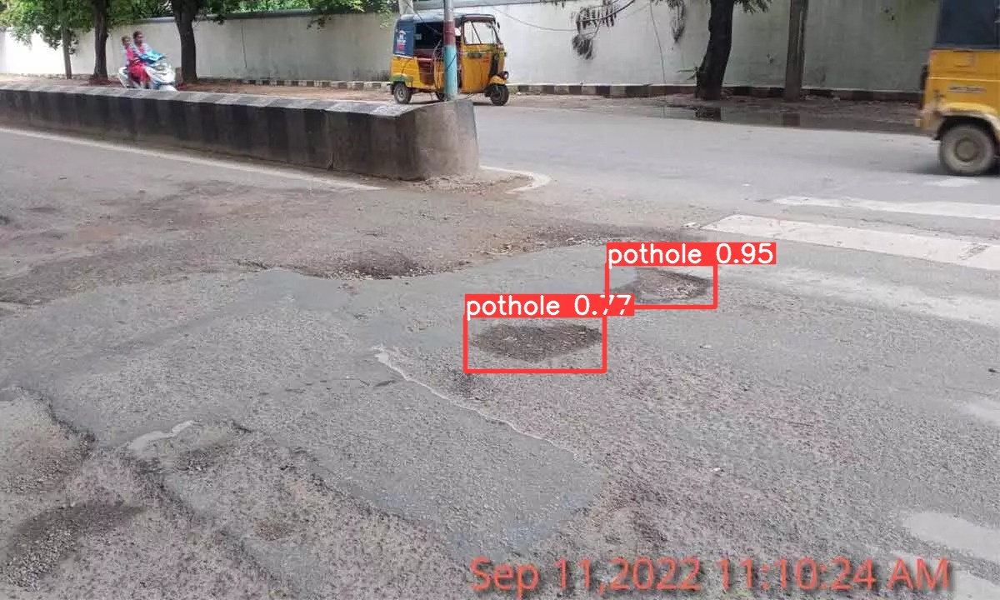

In [35]:
for imagename in glob.glob("/content/yolov5/runs/detect/exp5/*"):
  display(Image(filename=imagename))
  print("\n")

In [36]:
def def(path):
  !python detect.py --weights runs/train/yolov5s_results5/weights/best.pt --img 416 --conf 0.6 --source path

SyntaxError: ignored